In [2]:
# Let's study some statistics of the best solutions
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import pandas as pd

combined_solutions = pd.read_csv('fantasy_teams_solutions.csv')
deterministic_solutions = pd.read_csv('fantasy_teams_solutions_deterministic.csv')

In [49]:
# Create a new dataframe where we group by league and teams, calculating for each team, the total PPM, total final_PPM, total final_seasonal_points
grouped = combined_solutions.groupby(['League', 'Team_Number']).agg(
    total_cost=('price', 'sum'),
    total_PPM=('PPM', 'sum'),
    total_final_PPM=('final_PPM', 'sum'),
    total_final_seasonal_points=('final_seasonal_points', 'sum')
).reset_index()
# Group also by position_role and calculate the sum of price, ppm, final_ppm, final_seasonal_points
position_grouped = combined_solutions.groupby(['League', 'Team_Number', 'position_role']).agg(
    total_cost=('price', 'sum'),
    total_PPM=('PPM', 'sum'),
    total_final_PPM=('final_PPM', 'sum'),
    total_final_seasonal_points=('final_seasonal_points', 'sum'),
    count=('position_role', 'count')
).reset_index()

# Deterministic solutions
det_grouped = deterministic_solutions.groupby(['League', 'Team_Number']).agg(
    total_cost=('price', 'sum'),
    total_PPM=('PPM', 'sum'),
    total_final_PPM=('final_PPM', 'sum'),
    total_final_seasonal_points=('final_seasonal_points', 'sum')
).reset_index()
det_position_grouped = deterministic_solutions.groupby(['League', 'Team_Number', 'position_role']).agg(
    total_cost=('price', 'sum'),
    total_PPM=('PPM', 'sum'),
    total_final_PPM=('final_PPM', 'sum'),
    total_final_seasonal_points=('final_seasonal_points', 'sum'),
    count=('position_role', 'count')
).reset_index()

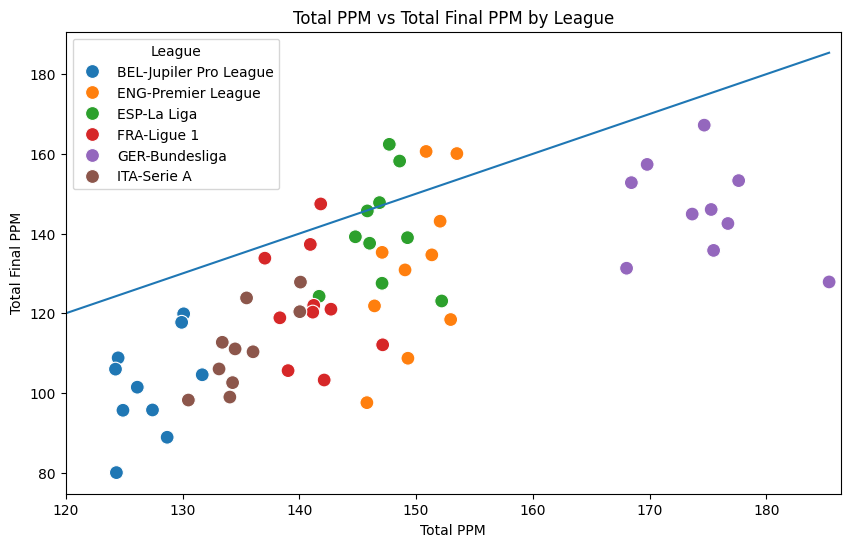

In [47]:
# Scatter plot of total_PPM vs total_final_PPM colored by League
plt.figure(figsize=(10, 6))
sns.scatterplot(data=grouped, x='total_PPM', y='total_final_PPM', hue='League', s=100)
# Add a line y=x for reference
max_val = max(grouped['total_PPM'].max(), grouped['total_final_PPM'].max())
plt.plot([80, max_val], [80, max_val])
plt.title('Total PPM vs Total Final PPM by League')
plt.xlim(120, max_val+1)
plt.xlabel('Total PPM')
plt.ylabel('Total Final PPM')
plt.legend(title='League', loc='best')
plt.show()

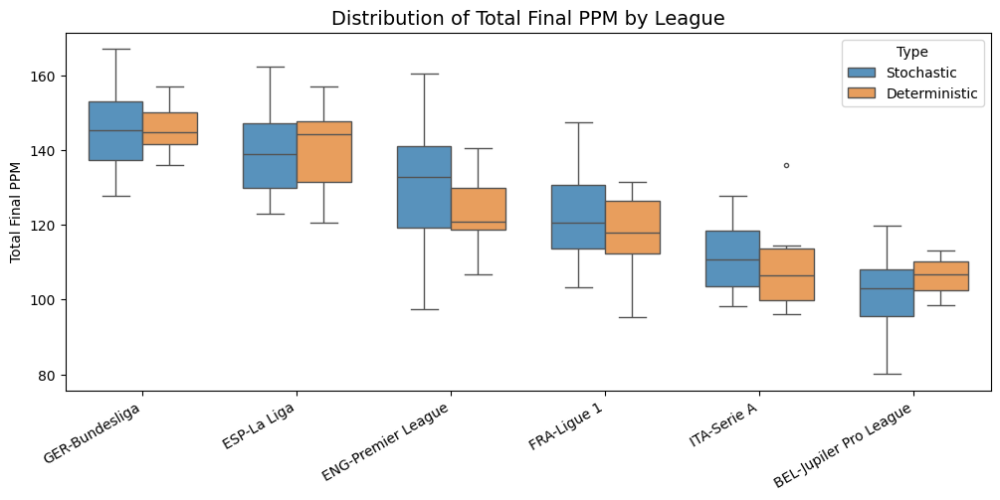

In [118]:
# Improve boxplot: avoid mutating originals, rotate x labels, expand bottom margin, add jittered points
g = grouped.copy()
d = det_grouped.copy()
g['Type'] = 'Stochastic'
d['Type'] = 'Deterministic'
comparison_df = pd.concat([g, d], ignore_index=True)

# Order leagues by median to get a stable, readable order
order = comparison_df.groupby('League')['total_final_PPM'].median().sort_values(ascending=False).index.tolist()

fig, ax = plt.subplots(figsize=(12, 6))
sns.boxplot(
    data=comparison_df, x='League', y='total_final_PPM', hue='Type',
    palette=["#4795cd", "#ff9c46"], width=0.7, fliersize=3, linewidth=1, order=order, ax=ax
)

# Remove duplicate legend entries created by stripplot
handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(), title='Type', loc='upper right')

ax.set_title('Distribution of Total Final PPM by League', fontsize=14)
ax.set_xlabel('')
ax.set_ylabel('Total Final PPM')

# rotate x labels and push them down to avoid overlap
plt.setp(ax.get_xticklabels(), rotation=30, ha='right')
fig.subplots_adjust(bottom=0.28)  # leave more room for long league names
plt.show()

In [4]:
# In each time, let's find the best combination of players to form a lineup of eleven players
# We will consider among the following formations:
formations = [
    {'GK': 1, 'DF': 3, 'MF': 4, 'FW': 3}, # 3-4-3
    {'GK': 1, 'DF': 3, 'MF': 5, 'FW': 2}, # 3-5-2
    {'GK': 1, 'DF': 4, 'MF': 3, 'FW': 3}, # 4-3-3
    {'GK': 1, 'DF': 4, 'MF': 4, 'FW': 2}, # 4-4-2
    {'GK': 1, 'DF': 4, 'MF': 5, 'FW': 1}, # 4-5-1
    {'GK': 1, 'DF': 5, 'MF': 3, 'FW': 2}, # 5-3-2
    {'GK': 1, 'DF': 5, 'MF': 4, 'FW': 1}, # 5-4-1
]

# Accumulate summaries in a list to avoid concat warnings and dtype surprises
_lineup_summaries = []

for _, team in grouped.iterrows():
    league = team['League']
    team_number = team['Team_Number']
    team_players = combined_solutions[(combined_solutions['League'] == league) & (combined_solutions['Team_Number'] == team_number)]
    best_lineup = None
    best_points = -1
    for formation in formations:
        gk_needed = formation['GK']
        df_needed = formation['DF']
        mf_needed = formation['MF']
        fw_needed = formation['FW']
        
        gk_players = team_players[team_players['position_role'] == 'GK'].nlargest(gk_needed, 'PPM')
        df_players = team_players[team_players['position_role'] == 'DF'].nlargest(df_needed, 'PPM')
        mf_players = team_players[team_players['position_role'] == 'MF'].nlargest(mf_needed, 'PPM')
        fw_players = team_players[team_players['position_role'] == 'FW'].nlargest(fw_needed, 'PPM')

        if len(gk_players) == gk_needed and len(df_players) == df_needed and len(mf_players) == mf_needed and len(fw_players) == fw_needed:
            lineup = pd.concat([gk_players, df_players, mf_players, fw_players])
            total_points = lineup['final_seasonal_points'].sum()
            if total_points > best_points:
                best_points = total_points
                best_lineup = lineup
                n_def = df_needed
                n_mid = mf_needed
                n_fwd = fw_needed
    
    if best_lineup is not None:
        lineup_summary = {
            'League': league,
            'Team_Number': team_number,
            'n_DF': n_def,
            'n_MF': n_mid,
            'n_FW': n_fwd,
            'Total_Cost': best_lineup['price'].sum(),
            'Total_PPM': best_lineup['PPM'].sum(),
            'Total_Final_Seasonal_Points': best_lineup['final_seasonal_points'].sum(),
            'Total_Final_PPM': best_lineup['final_PPM'].sum()
        }
        _lineup_summaries.append(lineup_summary)

# Build final DataFrame once (with consistent columns/dtypes)
columns = ['League', 'Team_Number', 'n_DF', 'n_MF', 'n_FW', 'Total_Cost', 'Total_PPM', 'Total_Final_Seasonal_Points', 'Total_Final_PPM']
if _lineup_summaries:
    lineup_solutions = pd.DataFrame(_lineup_summaries, columns=columns)
    # Ensure numeric columns have appropriate dtypes
    for col in ['Team_Number', 'n_DF', 'n_MF', 'n_FW']:
        lineup_solutions[col] = pd.to_numeric(lineup_solutions[col], errors='coerce').astype('Int64')
    for col in ['Total_Cost', 'Total_PPM', 'Total_Final_Seasonal_Points', 'Total_Final_PPM']:
        lineup_solutions[col] = pd.to_numeric(lineup_solutions[col], errors='coerce')
else:
    lineup_solutions = pd.DataFrame(columns=columns)

## Lineups Formation


=== BEL-Jupiler Pro League - Team 8 (3-4-3) ===


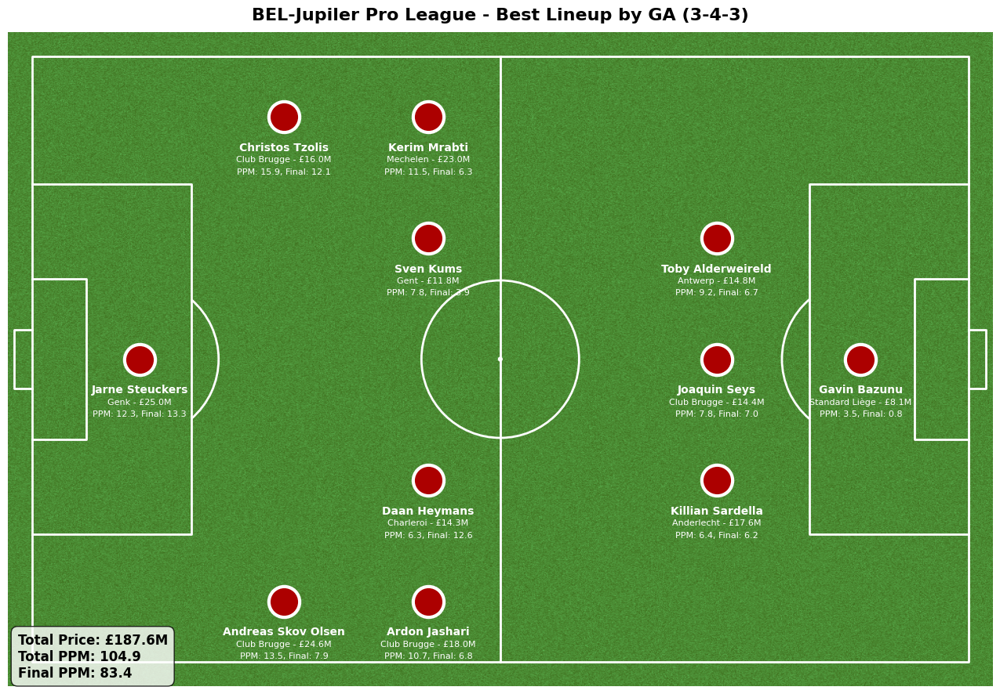


=== ENG-Premier League - Team 10 (3-4-3) ===


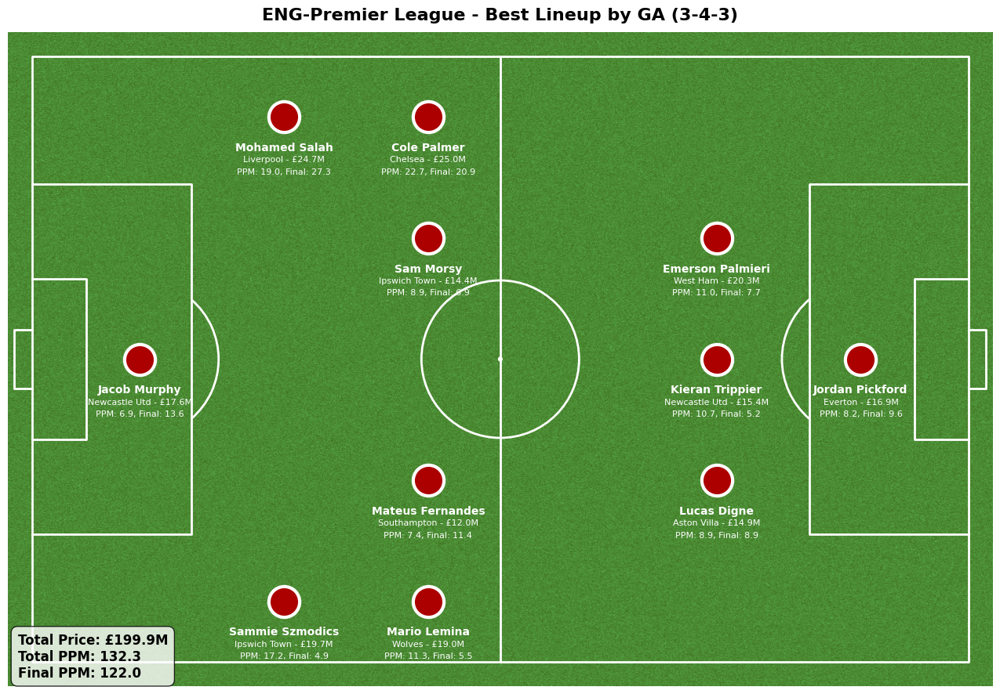


=== ESP-La Liga - Team 3 (3-4-3) ===


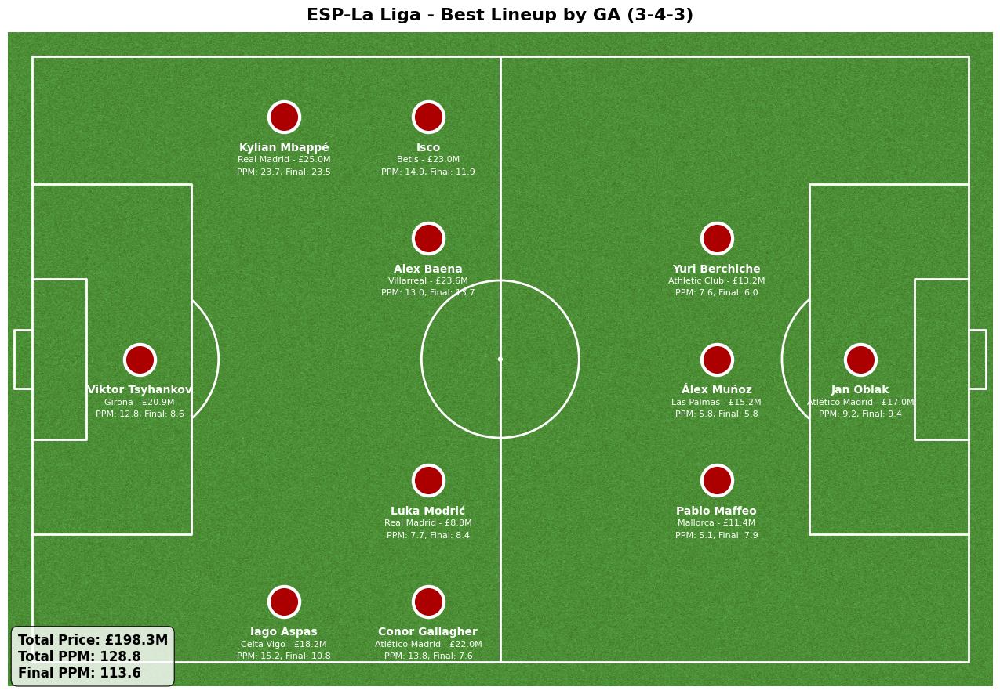


=== FRA-Ligue 1 - Team 7 (3-4-3) ===


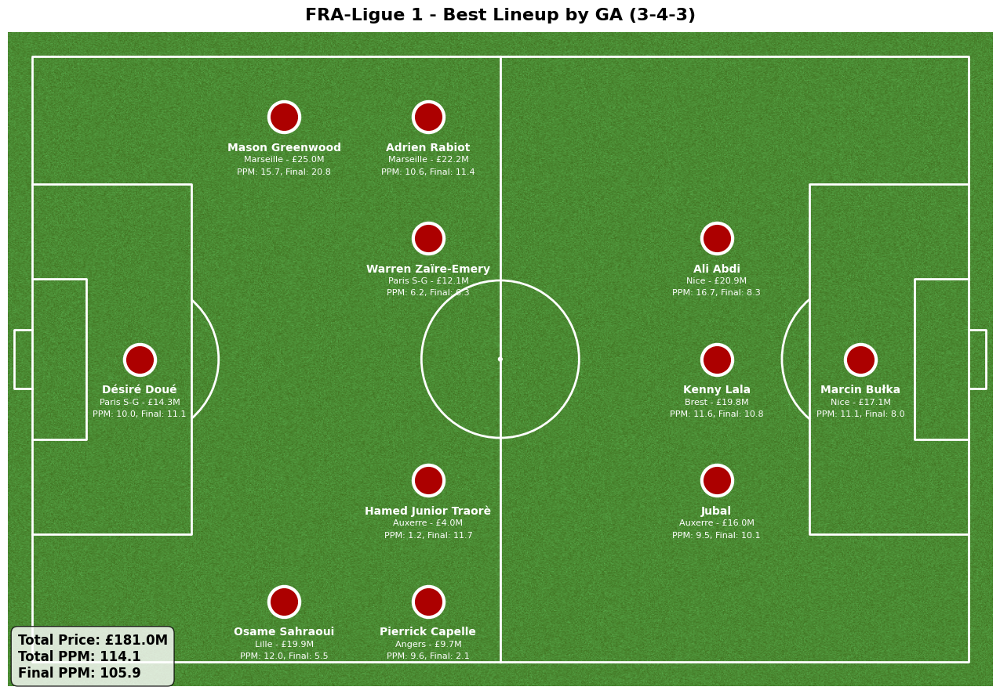


=== GER-Bundesliga - Team 6 (4-4-2) ===


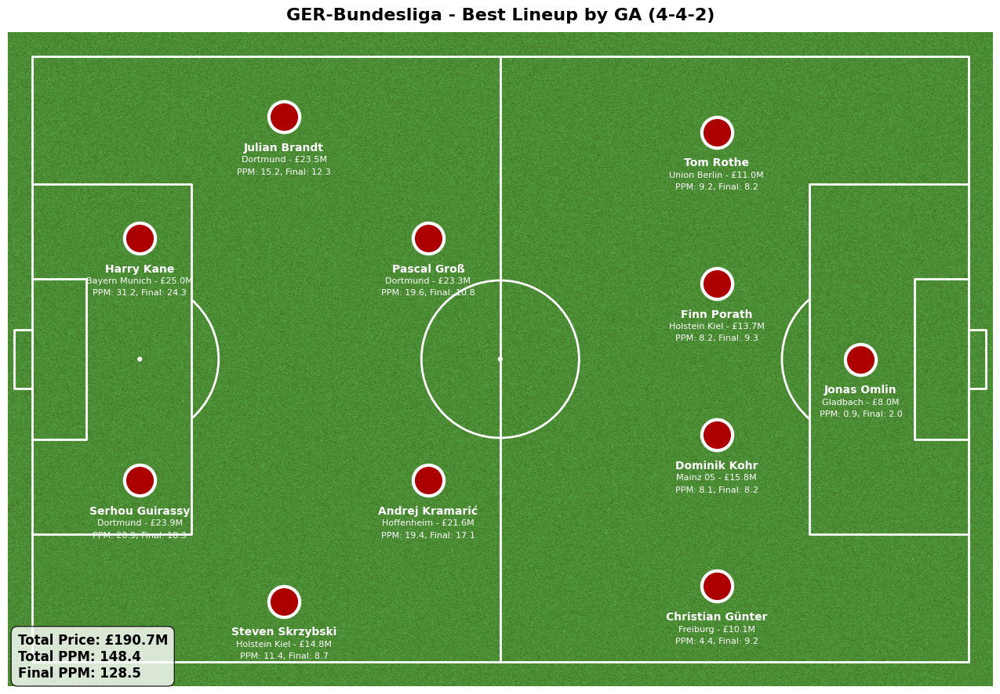


=== ITA-Serie A - Team 6 (5-3-2) ===


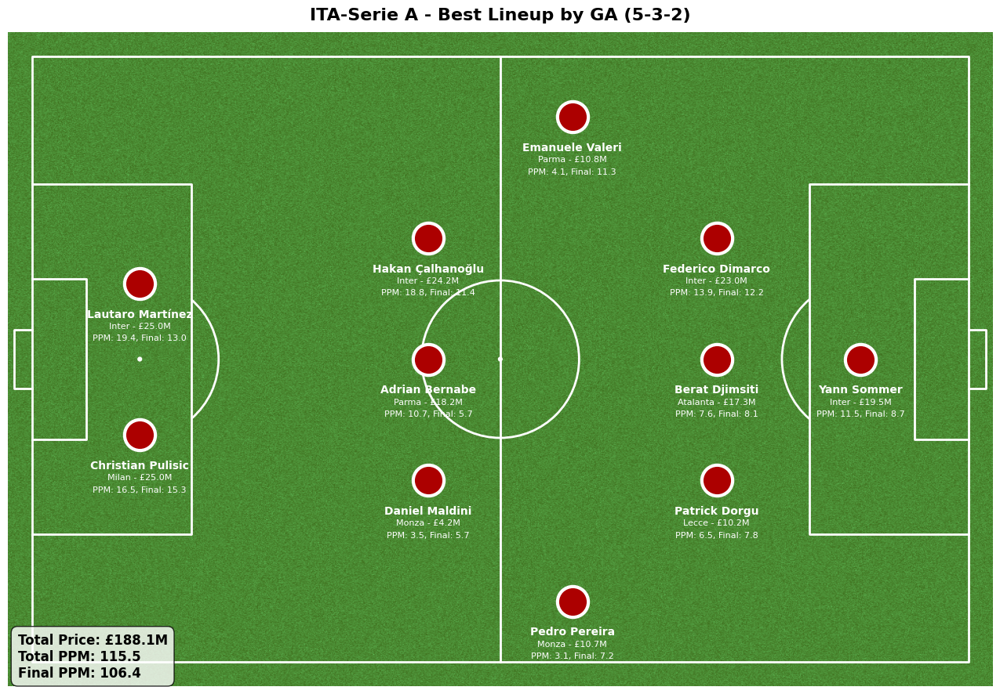

In [28]:
from mplsoccer import Pitch

# For each league, pick the lineup (from lineup_solutions) with highest Total_Final_PPM
# and plot the selected formation using mplsoccer.Pitch.

# map (DF,MF,FW) to common mplsoccer formation names
formation_name_map = {
    (3,4,3): '343flat',
    (3,5,2): '3142',
    (4,3,3): '433',
    (4,4,2): '4222',
    (4,5,1): '4141',
    (5,3,2): '352',
    (5,4,1): '541'
}

formation_positions = {
    '343flat': [1, 6, 5, 4, 2, 3, 7, 8, 10, 11, 9],
    '4222': [1, 2, 5, 6, 3, 4, 8, 7, 11, 10, 9],
    '352':  [1, 6, 5, 4, 2, 3, 7, 11, 8, 10, 9],
}


# get best lineup per league by Total_Final_PPM
idx = lineup_solutions.groupby('League')['Total_Final_PPM'].idxmax()
best_per_league = lineup_solutions.loc[idx].reset_index(drop=True)

for _, row in best_per_league.iterrows():

    league = row['League']
    team_number = int(row['Team_Number'])
    n_def = int(row['n_DF'])
    n_mid = int(row['n_MF'])
    n_fwd = int(row['n_FW'])
    print(f"\n=== {league} - Team {team_number} ({n_def}-{n_mid}-{n_fwd}) ===")
    
    # fetch players for that team
    team = combined_solutions[(combined_solutions['League'] == league) & 
                              (combined_solutions['Team_Number'] == team_number)]
    
    # select top players per role by PPM (same selection logic used before)
    gk_players = team[team['position_role'] == 'GK'].nlargest(1, 'PPM')
    df_players = team[team['position_role'] == 'DF'].nlargest(n_def, 'PPM')
    mf_players = team[team['position_role'] == 'MF'].nlargest(n_mid, 'PPM')
    fw_players = team[team['position_role'] == 'FW'].nlargest(n_fwd, 'PPM')
    
    # check completeness
    if not (len(gk_players)==1 and len(df_players)==n_def and len(mf_players)==n_mid and len(fw_players)==n_fwd):
        print(f"Skipping {league} Team {team_number}: incomplete roles (GK:{len(gk_players)}/1, DF:{len(df_players)}/{n_def}, MF:{len(mf_players)}/{n_mid}, FW:{len(fw_players)}/{n_fwd})")
        continue
    
    formation_team_df = pd.concat([gk_players, df_players, mf_players, fw_players])
    formation_key = (n_def, n_mid, n_fwd)
    formation_name = formation_name_map.get(formation_key, '343flat')
    
    # draw pitch and formation
    pitch = Pitch(pitch_type='opta', goal_type='box', pitch_color='grass', line_color='white', linewidth=2)
    fig, ax = pitch.draw(figsize=(16,9))
    
    # Prepare text lines
    player_names = formation_team_df['player'].tolist()
    player_teams_and_prices = [f"{t} - £{p:.1f}M" for t, p in zip(formation_team_df['team'], formation_team_df['price'])]
    player_ppm_and_final = [f"PPM: {ppm:.1f}, Final: {fppm:.1f}" for ppm, fppm in zip(formation_team_df['PPM'], formation_team_df['final_PPM'])]
    
    # scatter, text and additional text rows using pitch.formation
    pitch.formation(formation_name, positions=formation_positions[formation_name], kind='scatter', ax=ax, c="#AC0000", s=800, edgecolors='white', linewidth=3, flip=True)
    pitch.formation(formation_name, positions=formation_positions[formation_name], kind='text', text=player_names, ax=ax, fontsize=10, yoffset=-5,
                   ha='center', va='center', color='white', weight='bold', flip=True)
    pitch.formation(formation_name, positions=formation_positions[formation_name], kind='text', text=player_teams_and_prices, ax=ax, fontsize=8, yoffset=-7,
                   ha='center', va='center', color='white', flip=True)
    pitch.formation(formation_name, positions=formation_positions[formation_name], kind='text', text=player_ppm_and_final, ax=ax, fontsize=8, yoffset=-9,
                   ha='center', va='center', color='white', flip=True)

    # title and stats box
    fig.suptitle(f'{league} - Best Lineup by GA ({n_def}-{n_mid}-{n_fwd})', fontsize=16, fontweight='bold')
    total_price = formation_team_df['price'].sum()
    total_ppm = formation_team_df['PPM'].sum()
    total_final_ppm = formation_team_df['final_PPM'].sum()
    stats_text = f'Total Price: £{total_price:.1f}M\nTotal PPM: {total_ppm:.1f}\nFinal PPM: {total_final_ppm:.1f}'
    ax.text(0.01, 0.01, stats_text, transform=ax.transAxes, fontsize=12, fontweight='bold',
            ha='left', va='bottom', bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8), color='black')
    
    plt.tight_layout()
    plt.show()

## Convergences

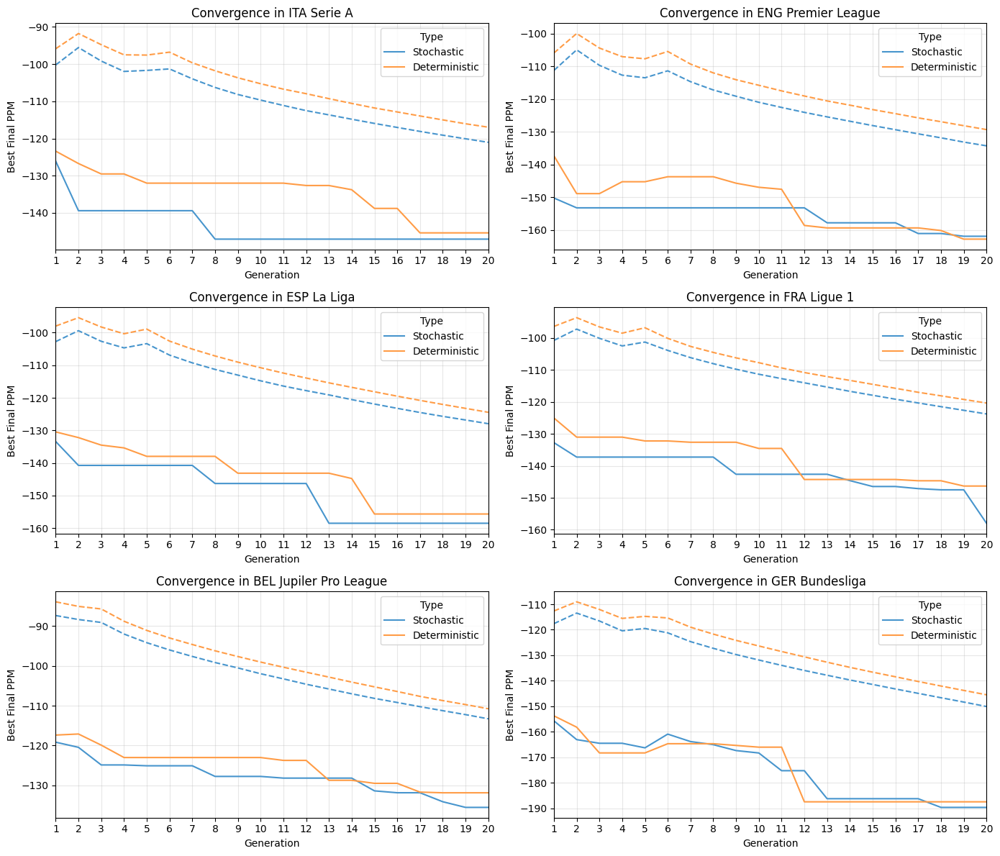

In [101]:
# Extract for each league the convergences csv and plot them
import os
# Move in the directory where the convergence files are located
convergence_stochastic_files = [f for f in os.listdir('.') if f.startswith('convergence_') and f.endswith('stochastic.csv')]
convergence_deterministic_files = [f for f in os.listdir('.') if f.startswith('convergence_') and f.endswith('deterministic.csv')]

convergence_dfs = []
for f in convergence_stochastic_files:
    df = pd.read_csv(f)
    df['League'] = f[len('convergence_'):-len('_stochastic.csv')].replace('_', ' ')
    df['Type'] = 'Stochastic'
    df['Generation'] = df.index + 1  # Ensure Generation starts from 1
    convergence_dfs.append(df)

for f in convergence_deterministic_files:
    df = pd.read_csv(f)
    league = f[len('convergence_'):-len('_deterministic.csv')]
    # Convert - in space for better display
    league = league.replace('_', ' ')
    df['League'] = league
    df['Type'] = 'Deterministic'
    df['Generation'] = df.index + 1 # Ensure Generation starts from 0
    convergence_dfs.append(df)

# Make a plot with subplots for each league (2 columns)
if convergence_dfs:
    all_convergences = pd.concat(convergence_dfs, ignore_index=True)
    leagues = all_convergences['League'].unique()
    n_leagues = len(leagues)
    n_cols = 2
    n_rows = (n_leagues + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, n_rows * 4), sharey=False, sharex=False)
    axes = axes.flatten()

    palette = {"Stochastic": "#4795cd", "Deterministic": "#ff9c46"}
    hue_order = ['Stochastic', 'Deterministic']

    for i, league in enumerate(leagues):
        ax = axes[i]
        league_data = all_convergences[all_convergences['League'] == league].sort_values('Generation')

        sns.lineplot(data=league_data, x='Generation', y='f_min', hue='Type', ax=ax,
                     palette=palette, hue_order=hue_order)
        sns.lineplot(data=league_data, x='Generation', y='f_avg', hue='Type', ax=ax,
                     palette=palette, hue_order=hue_order, linestyle='--', legend=False)

        ax.set_title(f'Convergence in {league}')
        ax.set_xlabel('Generation')
        ax.set_ylabel('Best Final PPM')
        # Make integer x-axis limits between 1 and 20
        ax.set_xticks(np.arange(1, 21, 1))
        ax.set_xlim(1, 20)

        ax.legend(title='Type')
        ax.grid(alpha=0.3)

    # remove any unused axes
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

## Budget Allocation Analysis

=== BUDGET ALLOCATION BY POSITION ===
  position_role  avg_cost  cost_percentage  avg_final_PPM  avg_ROI
0            DF     72.06            29.26          33.99     0.48
1            FW     69.35            28.16          41.50     0.61
2            GK     24.41             9.91           9.67     0.41
3            MF     80.43            32.66          40.30     0.50


/var/folders/y4/071n1shn1vz2cc6k8x71t0qr0000gn/T/ipykernel_5713/184103072.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=position_grouped, x='position_role', y='total_cost', ax=ax1, palette='viridis')


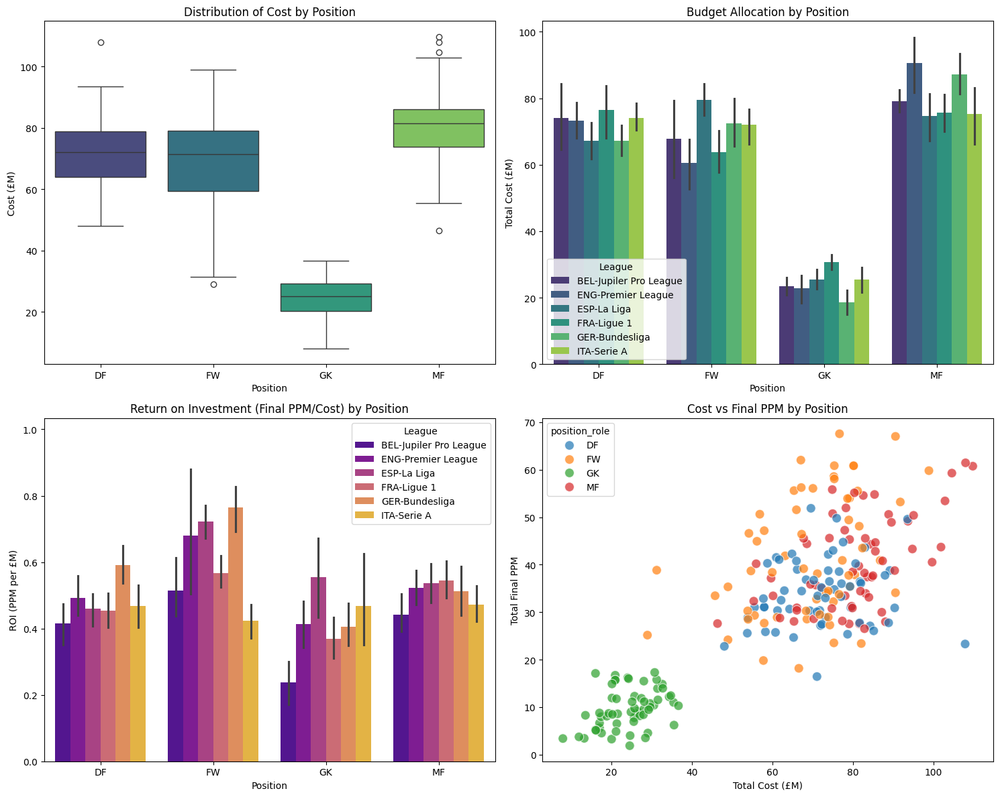


=== RETURN ON INVESTMENT ANALYSIS ===
                mean    std    min    max
position_role                            
DF             0.480  0.109  0.216  0.745
FW             0.612  0.193  0.273  1.241
GK             0.408  0.179  0.076  1.062
MF             0.505  0.105  0.318  0.745

=== BEST ROI PERFORMERS BY POSITION ===
DF: ROI=0.745 (League: GER-Bundesliga, Team: 9)
FW: ROI=1.241 (League: ENG-Premier League, Team: 8)
GK: ROI=1.062 (League: ITA-Serie A, Team: 3)
MF: ROI=0.745 (League: GER-Bundesliga, Team: 7)

=== COST EFFICIENCY SUMMARY ===
Most expensive position: MF
Best ROI position: FW
Worst ROI position: GK


In [ ]:
# Budget analysis, which side of the team the algorithm is spending more money on
# And what's his return on investment (Final PPM / Cost)

# Calculate ROI (Return on Investment) as Final PPM / Cost for each position
position_grouped['ROI'] = position_grouped['total_final_PPM'] / position_grouped['total_cost']

# Aggregate across all leagues to get overall spending patterns
overall_position_analysis = position_grouped.groupby('position_role').agg(
    avg_cost=('total_cost', 'mean'),
    total_cost=('total_cost', 'sum'),
    avg_final_PPM=('total_final_PPM', 'mean'),
    total_final_PPM=('total_final_PPM', 'sum'),
    avg_ROI=('ROI', 'mean'),
    team_count=('Team_Number', 'count')
).reset_index()

# Calculate percentage of total budget spent on each position
overall_position_analysis['cost_percentage'] = (overall_position_analysis['total_cost'] / 
                                               overall_position_analysis['total_cost'].sum()) * 100

print("=== BUDGET ALLOCATION BY POSITION ===")
print(overall_position_analysis[['position_role', 'avg_cost', 'cost_percentage', 'avg_final_PPM', 'avg_ROI']].round(2))

# Create visualizations
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))

# 1. Boxplot of cost by position
sns.boxplot(data=position_grouped, x='position_role', y='total_cost', ax=ax1, palette='viridis')
ax1.set_title('Distribution of Cost by Position')
ax1.set_ylabel('Cost (£M)')
ax1.set_xlabel('Position')

# 2. Budget allocation percentage for leagues
sns.barplot(data=position_grouped, x='position_role', y='total_cost', hue='League', ax=ax2, palette='viridis')
ax2.set_title('Budget Allocation by Position')
ax2.set_ylabel('Total Cost (£M)')
ax2.set_xlabel('Position')

# 3. ROI by position for leagues
sns.barplot(data=position_grouped, x='position_role', y='ROI', hue='League', ax=ax3, palette='plasma')
ax3.set_title('Return on Investment (Final PPM/Cost) by Position')
ax3.set_ylabel('ROI (PPM per £M)')
ax3.set_xlabel('Position')

# Slightly expand y-limit so annotations don't get cut off
ymin, ymax = ax3.get_ylim()
ax3.set_ylim(ymin, ymax * 1.12)

# 4. Cost vs Final PPM scatter with position colors
sns.scatterplot(data=position_grouped, x='total_cost', y='total_final_PPM', 
                hue='position_role', ax=ax4, s=100, alpha=0.7)
ax4.set_title('Cost vs Final PPM by Position')
ax4.set_xlabel('Total Cost (£M)')
ax4.set_ylabel('Total Final PPM')

plt.tight_layout()
plt.show()

# Detailed ROI analysis
print("\n=== RETURN ON INVESTMENT ANALYSIS ===")
roi_stats = position_grouped.groupby('position_role')['ROI'].agg(['mean', 'std', 'min', 'max']).round(3)
print(roi_stats)

# Find best and worst ROI performers by position
print("\n=== BEST ROI PERFORMERS BY POSITION ===")
for pos in position_grouped['position_role'].unique():
    pos_data = position_grouped[position_grouped['position_role'] == pos]
    best_roi = pos_data.loc[pos_data['ROI'].idxmax()]
    print(f"{pos}: ROI={best_roi['ROI']:.3f} (League: {best_roi['League']}, Team: {best_roi['Team_Number']})")

# Cost efficiency comparison
print(f"\n=== COST EFFICIENCY SUMMARY ===")
print(f"Most expensive position: {overall_position_analysis.loc[overall_position_analysis['avg_cost'].idxmax(), 'position_role']}")
print(f"Best ROI position: {overall_position_analysis.loc[overall_position_analysis['avg_ROI'].idxmax(), 'position_role']}")
print(f"Worst ROI position: {overall_position_analysis.loc[overall_position_analysis['avg_ROI'].idxmin(), 'position_role']}")